In [6]:
import os
import random
import time
import re
import gc
import pickle
from IPython.display import Image

import matplotlib.pyplot as plt
import numpy as np
import pandas as pd

from stockstats import StockDataFrame as Sdf
from sklearn import preprocessing

from keras.layers import Dense, Lambda, Layer, Input, Flatten
from keras.models import Sequential, Model
from keras.optimizers import Adam
from keras.models import load_model
from keras.callbacks import ModelCheckpoint
from keras import backend as K

from Environment.core import Env
from Environment.core import DataGenerator
from Environment.core import Agent

import warnings
warnings.filterwarnings('ignore')

%load_ext autoreload
%autoreload 2

# Data Generator

Data generator is used to sequentially produce new data in the environment. Considering you're only one participant in the huge market, the next day price in our generator does not depend on your bot action today.

Overwrite *\_generator()* method in *CSVStreamer* class. Data we sequentially produce is a vector of (bid, ask, mid, rsi, cci, dmi, vol). rsi(relative strength index), cci(commodity channel index), and dmi(directional moving index) are technical indicators.

- rsi is roughly equal to the (modified) moving average of raise divided by fall. It descibe if an asset is oversold or overbought.

In [7]:
class CSVStreamer(DataGenerator):
    """Data generator from csv file.
    The csv file should no index columns.

    Args:
        filename (str): Filepath to a csv file.
        header (bool): True if the file has got a header, False otherwise
    """
    @staticmethod
    def _generator(filename, header=False, split=0.8, mode='train',spread=.005):
        df = pd.read_csv(filename)
        if "Name" in df:
            df.drop('Name',axis=1,inplace=True)
        _stock = Sdf.retype(df.copy()) # stockstats.StockDataFrame object
        _stock.get('cci_14')
        _stock.get('rsi_14')
        _stock.get('dx_14')
        _stock = _stock.dropna(how='any')

        min_max_scaler = preprocessing.MinMaxScaler((-1, 1)) #sklearn 
        np_scaled = min_max_scaler.fit_transform(_stock[['rsi_14', 'cci_14','dx_14','volume']])
        df_normalized = pd.DataFrame(np_scaled)
        df_normalized.columns = ['rsi_14', 'cci_14','dx_14','volume']
        df_normalized['bid'] = _stock['close'].values
        df_normalized['ask'] = df_normalized['bid'] + spread # simulate bid-ask spread
        df_normalized['mid'] = (df_normalized['bid'] + df_normalized['ask'])/2

        split_len=int(split*len(df_normalized))

        if(mode=='train'):
            raw_data = df_normalized[['ask','bid','mid','rsi_14','cci_14','dx_14','volume']].iloc[:split_len,:]
        else:
            raw_data = df_normalized[['ask', 'bid', 'mid', 'rsi_14', 'cci_14','dx_14','volume']].iloc[split_len:,:]

        for index, row in raw_data.iterrows(): 
            # row is pd.Series
            # raw_data.iterrows is a generator object
            yield row.values # row.as_matrix() is np.array


    def _iterator_end(self):
        """Rewinds if end of data reached.
        """
        # print("End of data reached, rewinding.")
        super(self.__class__, self).rewind()

    def rewind(self):
        """For this generator, we want to rewind only when the end of the data is reached.
        """
        self._iterator_end()

In [8]:
## Example
genObj = CSVStreamer( filename="./Data1/AAPL_data.csv",
                      mode="train", split=.8 )
idx = 0
while( idx < 3):
    print( genObj.__next__() )
    idx += 1

[68.5664     68.5614     68.5639      1.          0.14625528  1.
 -0.0793031 ]
[66.8478     66.8428     66.8453     -0.60460595 -0.23032917 -0.96429939
  0.09926948]
[66.7206     66.7156     66.7181     -0.6380375  -0.36968543 -0.32498669
 -0.16003245]


# Environment 

Build environment module. Several methods should be implemented - *reset(), step(), render(), ...*

In [9]:
class StockTradingEnv( Env ):
    """Class for a discrete (buy/hold/sell) spread trading environment.
    """

    _actions = {
        'hold': np.array([1, 0, 0]),
        'buy': np.array([0, 1, 0]),
        'sell': np.array([0, 0, 1])
    }

    _positions = {
        'flat': np.array([1, 0, 0]),
        'long': np.array([0, 1, 0]),
        'short': np.array([0, 0, 1])
    }

    def __init__(self, data_generator, episode_length=1000,
                 trading_fee=0, time_fee=0, profit_taken=20, stop_loss=-10,
                 reward_factor=10000, history_length=2):
        """Initialisation function

        Args:
            data_generator (tgym.core.DataGenerator): A data
                generator object yielding a 1D array of bid-ask prices.
            episode_length (int): number of steps to play the game for
            trading_fee (float): penalty for trading
            time_fee (float): time fee
            history_length (int): number of historical states to stack in the
                observation vector.
        """

        assert history_length > 0
        self._data_generator = data_generator
        self._first_render = True
        self._trading_fee = trading_fee
        self._time_fee = time_fee
        self._episode_length = episode_length
        self.n_actions = 3
        self._prices_history = []
        self._history_length = history_length
        self._tick_buy = 0
        self._tick_sell = 0
        self.tick_mid = 0 # saeed
        self.tick_cci_14 = 0
        self.tick_rsi_14=0
        self.tick_dx_14 = 0
        self._price = 0
        self._round_digits = 4
        self._holding_position = []  # [('buy',price, profit_taken, stop_loss),...]
        self._max_lost = -1000
        self._reward_factor = reward_factor
        self.reset()
        self.TP_render=False
        self.SL_render = False
        self.Buy_render=False
        self.Sell_render=False
        self.current_action="-"
        self.current_reward=0
        self.unr_pnl=0

    def reset(self):
        """Reset the trading environment. Reset rewards, data generator...

        Returns:
            observation (numpy.array): observation of the state
        """
        self._iteration = 0
        self._data_generator.rewind()
        # self._data_generator._iterator_end()
        self._total_reward = 0
        self._total_pnl = 0
        self._current_pnl = 0
        self._position = self._positions['flat']
        # self._entry_price = 0
        # self._exit_price = 0
        self._closed_plot = False
        self._holding_position = []
        self._max_lost = -1000
        for i in range(self._history_length): #archived stack
            self._prices_history.append(next(self._data_generator))
        self._tick_buy, self._tick_sell,self.tick_mid ,self.tick_rsi_14,self.tick_cci_14= \
            self._prices_history[0][:5]
        # self._tick_buy, self._tick_sell,self.tick_mid ,self.tick_rsi_14,self.tick_cci_14, self.tick_dx_14= \
        #     self._prices_history[0][:6]

        observation = self._get_observation() # not include bid,ask,mid??
        self.state_shape = observation.shape
        self._action = self._actions['hold']
        return observation

    def step(self, action):
        """Take an action (buy/sell/hold) and computes the immediate reward.

        Args:
            action (numpy.array): Action to be taken, one-hot encoded.

        Returns:
            tuple:
                - observation (numpy.array): Agent's observation of the current environment.
                - reward (float) : Amount of reward returned after previous action.
                - done (bool): Whether the episode has ended, in which case further step() calls will return undefined results.
                - info (dict): Contains auxiliary diagnostic information (helpful for debugging, and sometimes learning).

        """

        self._action = action
        self._iteration += 1
        done = False
        info = {}
        if all(self._position != self._positions['flat']):
            reward = -self._time_fee
        self._current_pnl=0

        #-------------------
        instant_pnl=0
        reward = -self._time_fee
        if all(action == self._actions['buy']):
            reward -= self._trading_fee
            if all(self._position == self._positions['flat']):
                self._position = self._positions['long']
                self._entry_price = self._price = self._tick_buy
                self.Buy_render = True
            elif all(self._position == self._positions['short']):
                self._exit_price = self._exit_price = self._tick_sell
                instant_pnl = self._entry_price - self._exit_price
                self._position = self._positions['flat']
                self._entry_price = 0
                # self.Buy_render = True
                if (instant_pnl > 0):
                    self.TP_render=True
                else:
                    self.SL_render=True

        elif all(action == self._actions['sell']):
            reward -= self._trading_fee
            if all(self._position == self._positions['flat']):
                self._position = self._positions['short']
                self._entry_price = self._price = self._tick_sell
                self.Sell_render = True
            elif all(self._position == self._positions['long']):
                self._exit_price = self._tick_buy
                instant_pnl = self._exit_price - self._entry_price
                self._position = self._positions['flat']
                self._entry_price = 0
                # self.Sell_render = True
                if (instant_pnl > 0):
                    self.TP_render = True
                else:
                    self.SL_render = True

        else:
            self.Buy_render = self.Sell_render = False
            self.TP_render = self.SL_render = False

        reward += instant_pnl
        self._total_pnl += instant_pnl
        self._total_reward += reward

        try:
            self._prices_history.append(next(self._data_generator))
            self._tick_sell, self._tick_buy, self.tick_mid, self.tick_rsi_14, self.tick_cci_14= \
            self._prices_history[-1][:5]
        except StopIteration:
            done = True
            info['status'] = 'No more data.'

        # Game over logic
        if self._iteration >= self._episode_length:
            done = True
            info['status'] = 'Time out.'
        if reward <= self._max_lost:
            done = True
            info['status'] = 'Bankrupted.'
        if self._closed_plot:
            info['status'] = 'Closed plot'

        observation = self._get_observation()

        return observation, reward, done, info

    def _handle_close(self, evt):
        self._closed_plot = True


    def return_calc(self,render_show=False):
        trade_details= {}
        if self.Sell_render:
            trade_details = {'Trade':'SELL','Price':self._tick_sell,'Time':self._iteration}
        elif self.Buy_render:
            trade_details = {'Trade': 'BUY', 'Price': self._tick_buy, 'Time': self._iteration}
        if self.TP_render:
            trade_details = {'Trade': 'TP', 'Price': self._exit_price, 'Time': self._iteration}
        elif self.SL_render:
            trade_details = {'Trade': 'SL', 'Price': self._exit_price, 'Time': self._iteration}

        if(not render_show):
            self.TP_render=self.SL_render=False
            self.Buy_render=self.Sell_render=False

        return trade_details

    def render(self, savefig=False, filename='myfig'):
        """Matlplotlib rendering of each step.

        Args:
            savefig (bool): Whether to save the figure as an image or not.
            filename (str): Name of the image file.
        """
        if self._first_render:
            self._f, (self._ax, self._ay, self._az, self._at) = plt.subplots(nrows=4, ncols=1, sharex=True, sharey=False, squeeze=True,
                        gridspec_kw={'height_ratios': [4, 1, 1, 0]},)



            self._ax = [self._ax]
            self._ay = [self._ay]
            self._az = [self._az]
            self._at = [self._at]
            self._f.set_size_inches(12, 6)
            self._first_render = False
            self._f.canvas.mpl_connect('close_event', self._handle_close)


        #  price
        ask, bid, mid, rsi, cci = self._tick_buy, self._tick_sell,self.tick_mid, self.tick_rsi_14, self.tick_cci_14

        self._ax[-1].plot([self._iteration, self._iteration + 1], [mid, mid], color='white')
        self._ay[-1].plot([self._iteration, self._iteration + 1], [cci, cci], color='green')
        self._az[-1].plot([self._iteration, self._iteration + 1], [rsi, rsi], color='blue')
        self._ay[0].set_ylabel('CCI')
        self._az[0].set_ylabel('RSI')

        ymin, ymax = self._ax[-1].get_ylim()
        yrange = ymax - ymin
        if self.Sell_render:
            self._ax[-1].scatter(self._iteration + 0.5, bid + 0.03 *
                                 yrange, color='orangered', marker='v')
        elif self.Buy_render:
            self._ax[-1].scatter(self._iteration + 0.5, ask - 0.03 *
                                 yrange, color='lawngreen', marker='^')
        if self.TP_render:
            self._ax[-1].scatter(self._iteration + 0.5, bid + 0.03 *
                                 yrange, color='gold', marker='.')
        elif self.SL_render:
            self._ax[-1].scatter(self._iteration + 0.5, ask - 0.03 *
                                 yrange, color='maroon', marker='.')


        self.TP_render=self.SL_render=False
        self.Buy_render=self.Sell_render=False

        plt.suptitle('Total Reward: ' + "%.2f" % self._total_reward +
                     '  Total PnL: ' + "%.2f" % self._total_pnl +
                     '  Unrealized Return: ' + "%.2f" % (self.unrl_pnl*100)  + "% "+
                     '  Pstn: ' + ['flat', 'long', 'short'][list(self._position).index(1)] +
                     '  Action: ' + ['flat', 'long', 'short'][list(self._action).index(1)] +
                     '  Tick:' + "%.2f" % self._iteration)
        self._f.tight_layout(pad=0.4, w_pad=0.5, h_pad=1.0)

        plt.xticks(range(self._iteration)[::5])
        plt.xlim([max(0, self._iteration - 80.5), self._iteration + 0.5])

        plt.subplots_adjust(top=0.85)
        plt.pause(0.00001) # 0.01
        if savefig:
            plt.savefig(filename)

    def _get_observation(self):
        """Concatenate all necessary elements to create the observation.

        Returns:
            numpy.array: observation array.
        """
        if all(self._position==self._positions['flat']):
            self.unrl_pnl=0
        elif all(self._position==self._positions['long']):
            self.unrl_pnl = (self._prices_history[-1][2]-self._price)/self._prices_history[-1][2]
        elif all(self._position==self._positions['short']):
            self.unrl_pnl = (self._price - self._prices_history[-1][2])/self._prices_history[-1][2]

        return np.concatenate(
            [self._prices_history[-1][3:]] +
            [
                np.array([self.unrl_pnl]),
                np.array(self._position)
            ]
        )

    @staticmethod
    def random_action_fun():
        """The default random action for exploration.
        We hold 80% of the time and buy or sell 10% of the time each.

        Returns:
            numpy.array: array with a 1 on the action index, 0 elsewhere.
        """
        return np.random.multinomial(1, [0.8, 0.1, 0.1])

In [10]:
envObj = StockTradingEnv( data_generator = genObj,
                          trading_fee = .002,
                          time_fee = 0.,
                          episode_length = 100)

In [11]:
envObj._prices_history

[array([68.5664    , 68.5614    , 68.5639    ,  1.        ,  0.14625528,
         1.        , -0.0793031 ]),
 array([66.8478    , 66.8428    , 66.8453    , -0.60460595, -0.23032917,
        -0.96429939,  0.09926948])]

In [12]:
envObj.step([0,1,0]) # c + unrl_pnl + position vector

(array([-0.6380375 , -0.36968543, -0.32498669, -0.16003245, -0.02770313,
         0.        ,  1.        ,  0.        ]),
 -0.002,
 False,
 {})

In [13]:
envObj._prices_history

[array([68.5664    , 68.5614    , 68.5639    ,  1.        ,  0.14625528,
         1.        , -0.0793031 ]),
 array([66.8478    , 66.8428    , 66.8453    , -0.60460595, -0.23032917,
        -0.96429939,  0.09926948]),
 array([66.7206    , 66.7156    , 66.7181    , -0.6380375 , -0.36968543,
        -0.32498669, -0.16003245])]

# Agent

### DQN Agent

* Bellman Equation
$$Q^{*}(s,a) = \mathbb{E} [r + \gamma\max_{a}Q^{*}(s^{'},a)]$$




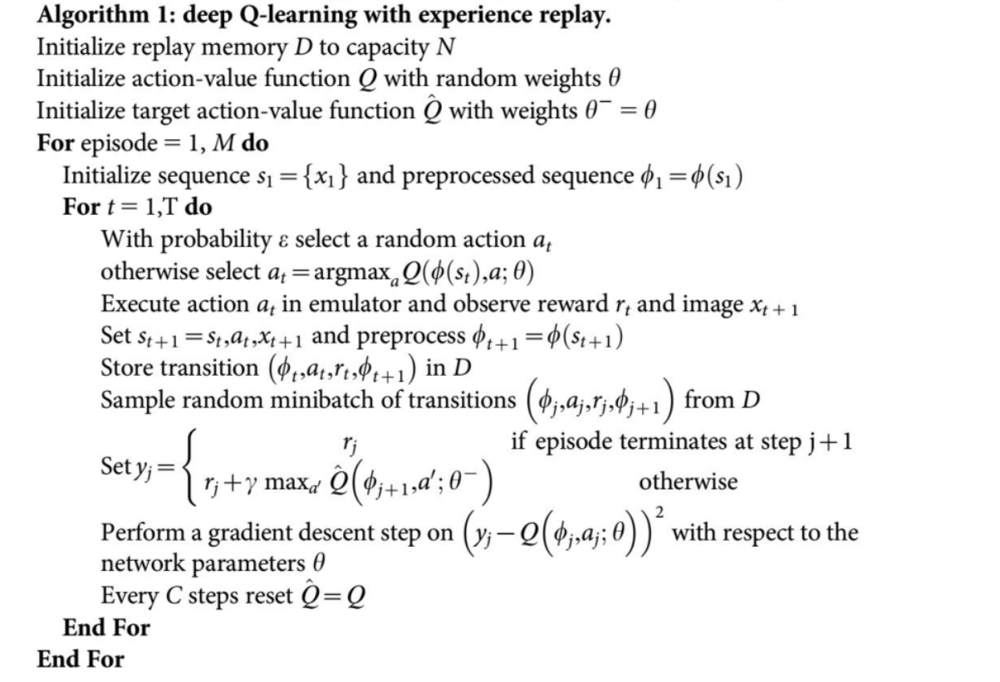

In [2]:
Image(filename='./fig/dqn.png')

In [14]:
class DQNAgent(Agent):
    def __init__(self,
                 state_size,
                 action_size,
                 episodes,
                 episode_length,
                 train_interval=100, # fit model from buffer every train_interval steps
                 Update_target_frequency=100,
                 memory_size=2000,
                 gamma=0.95,
                 learning_rate=0.001,
                 batch_size=64,
                 epsilon_min=0.01,
                 train_test='train',
                 symbol="dqn"
                 ):
        self.state_size = state_size
        self.action_size = action_size
        self.memory_size = memory_size
        self.memory = [None] * memory_size # replay buffersa
        self.gamma = gamma
        
        # epsilon is the prob of exploration
        self.epsilon = 1.0
        self.epsilon_min = epsilon_min
        self.epsilon_decrement = (self.epsilon - epsilon_min) \
                                 * train_interval / (episodes * episode_length)  # linear decrease rate
        self.learning_rate = learning_rate
        self.train_interval = train_interval
        
        # stablize training
        self.Update_target_frequency = Update_target_frequency
        self.batch_size = batch_size
        self.brain = self._build_brain()
        # target net
        self.brain_ = self._build_brain()
        self.i = 0
        self.train_test = train_test
        self.symbol=symbol


    def save_model(self):
        if not os.path.exists( r'./Saved Models/' ):
            os.mkdir( r'./Saved Models/' )
        self.brain.save(r'./Saved Models/'+self.symbol+'.h5')

    def load_model(self):
        print(self.symbol, "path=",'./Saved Models/'+self.symbol+'.h5')
        self.brain = load_model(r'./Saved Models/'+self.symbol+'.h5')

    def _build_brain(self):
        """Build the agent's brain
        """
        brain = Sequential()
        neurons_per_layer = 24
        activation = "relu"
        brain.add(Dense(neurons_per_layer,
                        input_dim=self.state_size,
                        activation=activation))
        brain.add(Dense(neurons_per_layer * 2, activation=activation))
        brain.add(Dense(neurons_per_layer * 4, activation=activation))
        brain.add(Dense(self.action_size, activation='linear'))
        brain.compile(loss='mse', optimizer=Adam(lr=self.learning_rate))
        return brain

    def act(self, state, test=False):
        """Acting Policy of the DQNAgent
        """
        act_values=[]
        action = np.zeros(self.action_size)
        if np.random.rand() <= self.epsilon and self.train_test == 'train' and not test:
            action[random.randrange(
                self.action_size)] = 1  # it would put 1 in either of the 3 action positions randomly
        else:
            state = state.reshape(1, self.state_size)
            act_values = self.brain.predict(state)
            action[np.argmax(act_values[0])] = 1
        if test:
            return action, act_values
        else:
            return action


    def observe(self, state, action, reward, next_state, done, warming_up=False):
        """Memory Management and training of the agent
        """
        self.i = (self.i + 1) % self.memory_size
        self.memory[self.i] = (state, action, reward, next_state, done)
        if (self.i == self.memory_size - 1):
            # print("Memory Refilled")
            pass
        if (not warming_up) and (self.i % self.train_interval) == 0:
            if self.epsilon > self.epsilon_min:
                self.epsilon -= self.epsilon_decrement
            state, action, reward, next_state, done = self._get_batches()
            reward += (self.gamma
                       * np.logical_not(done)
                       * np.amax(self.brain.predict(next_state),
                                 axis=1))
            q_target = self.brain.predict(state)
            q_target[action[0], action[1]] = reward

            return self.brain.fit(state, q_target,
                                  batch_size=self.batch_size,
                                  epochs=1,
                                  verbose=False,
                                  validation_split=0.1)

    def _get_batches(self):
        """Selecting a batch of memory
           Split it into categorical subbatches
           Process action_batch into a position vector
        """
        batch = np.array(random.sample(self.memory, self.batch_size))
        state_batch = np.concatenate(batch[:, 0]) \
            .reshape(self.batch_size, self.state_size)
        action_batch = np.concatenate(batch[:, 1]) \
            .reshape(self.batch_size, self.action_size)
        reward_batch = batch[:, 2]
        next_state_batch = np.concatenate(batch[:, 3]) \
            .reshape(self.batch_size, self.state_size)
        done_batch = batch[:, 4]
        # action processing
        action_batch = np.where(action_batch == 1)
        return state_batch, action_batch, reward_batch, next_state_batch, done_batch




## Dueling DQN

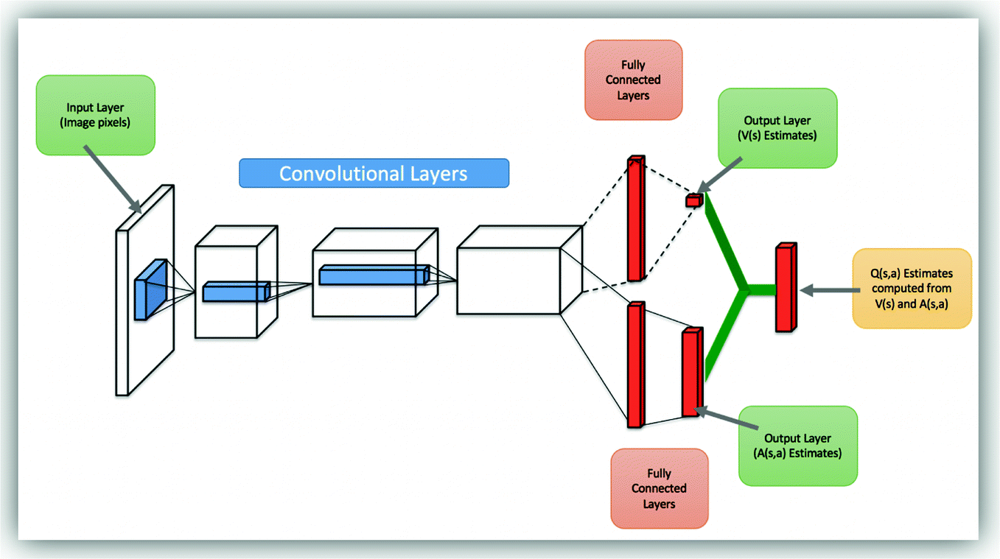

In [3]:
Image(filename='./fig/dueling_dqn_1.png')

The key motivation behind this architecture is that for some games, it is unnecessary to know the value of each action at every timestep. The authors give an example of the Atari game Enduro, where it is not necessary to know which action to take until collision is imminent.

$$Q(s,a;\theta,\alpha,\beta) = V(s;\theta,\beta) + A(s,a;\theta,\alpha)$$
$$Q(s,a;\theta,\alpha,\beta) = V(s;\theta,\beta) + A(s,a;\theta,\alpha) - 
\max_a A(s,a;\theta,\alpha)$$
$$Q(s,a;\theta,\alpha,\beta) = V(s;\theta,\beta) + A(s,a;\theta,\alpha) - 
Avg_a A(s,a;\theta,\alpha)$$


In [5]:
class DuelingDQNAgent(Agent):
    def __init__(self,
                 state_size,
                 action_size,
                 episodes,
                 episode_length,
                 train_interval=100,
                 Update_target_frequency=100,
                 memory_size=2000,
                 gamma=0.95,
                 learning_rate=0.001,
                 batch_size=64,
                 epsilon_min=0.01,
                 train_test='train',
                 symbol="duelingdqn"
                 ):
        self.state_size = state_size
        self.action_size = action_size
        self.memory_size = memory_size
        self.memory = [None] * memory_size
        self.gamma = gamma
        self.epsilon = 1.0
        self.epsilon_min = epsilon_min
        self.epsilon_decrement = (self.epsilon - epsilon_min) \
                                 * train_interval / (episodes * episode_length)  # linear decrease rate
        self.learning_rate = learning_rate
        self.train_interval = train_interval
        self.Update_target_frequency = Update_target_frequency
        self.batch_size = batch_size
        self.brain = self._build_brain()
        self.brain_ = self._build_brain()
        self.i = 0
        self.train_test = train_test
        self.symbol=symbol


    def save_model(self):
        self.brain.save(r'./Saved Models/'+self.symbol+'.h5')

    def load_model(self):
        print(self.symbol, "path=",'./Saved Models/'+self.symbol+'.h5')
        self.brain = load_model(r'./Saved Models/'+self.symbol+'.h5')

    def _build_brain(self):
        """Build the agent's brain
        """
        # pdb.set_trace()
        brain = Sequential()
        neurons_per_layer = 24
        activation = "relu"
        brain.add(Dense(neurons_per_layer,
                        input_dim=self.state_size,
                        activation=activation))
        brain.add(Dense(neurons_per_layer*2, activation=activation))
        brain.add(Dense(neurons_per_layer*4, activation=activation))
        brain.add(Dense(self.action_size, activation='linear'))
        layer = brain.layers[-2]  # Get the second last layer of the model
        nb_action = brain.output._keras_shape[-1]  #  remove the last layer
        y = Dense(nb_action + 1, activation='linear')(layer.output)
        outputlayer = Lambda(lambda a: K.expand_dims(a[:, 0], -1) + a[:, 1:] - K.mean(a[:, 1:], keepdims=True),
                             output_shape=(nb_action,))(y)  #  Using the max dueling type
        brain = Model(inputs=brain.input, outputs=outputlayer)
        brain.compile(loss='mse', optimizer=Adam(lr=self.learning_rate))

        return brain

    def act(self, state, test=False):
        """Acting Policy of the DDDQNAgent
        """
        act_values=[]
        action = np.zeros(self.action_size)
        if np.random.rand() <= self.epsilon and self.train_test == 'train' and not test:
            action[random.randrange(
                self.action_size)] = 1  # saeed : it would put 1 in either of the 3 action positions randomly
        else:
            state = state.reshape(1, self.state_size)
            act_values = self.brain.predict(state)
            action[np.argmax(act_values[0])] = 1
        if test:
            return action, act_values
        else:
            return action

    def updateTargetModel(self):
        self.brain_.set_weights(self.brain.get_weights())

    def observe(self, state, action, reward, next_state, done, warming_up=False):
        """Memory Management and training of the agent
        """
        self.i = (self.i + 1) % self.memory_size
        self.memory[self.i] = (state, action, reward, next_state, done)
        if (self.i == self.memory_size - 1):
            # print("Memory Refilled")
            pass
        if (not warming_up) and (self.i % self.train_interval) == 0:
            if self.epsilon > self.epsilon_min:
                self.epsilon -= self.epsilon_decrement
            state, action, reward, next_state, done = self._get_batches()
            reward += (self.gamma
                       * np.logical_not(done)
                       *self.brain_.predict(next_state)[range(self.batch_size), (np.argmax(self.brain.predict(next_state), axis=1))])
            q_target = self.brain.predict(state)
            q_target[action[0], action[1]] = reward

            if self.i % self.Update_target_frequency == 0:
                self.updateTargetModel()


            return self.brain.fit(state, q_target,
                                  batch_size=self.batch_size,
                                  epochs=1,
                                  verbose=False,
                                  validation_split=0.1)

    def _get_batches(self):
        """Selecting a batch of memory
           Split it into categorical subbatches
           Process action_batch into a position vector
        """
        batch = np.array(random.sample(self.memory, self.batch_size))
        state_batch = np.concatenate(batch[:, 0]) \
            .reshape(self.batch_size, self.state_size)
        action_batch = np.concatenate(batch[:, 1]) \
            .reshape(self.batch_size, self.action_size)
        reward_batch = batch[:, 2]
        next_state_batch = np.concatenate(batch[:, 3]) \
            .reshape(self.batch_size, self.state_size)
        done_batch = batch[:, 4]
        # action processing
        action_batch = np.where(action_batch == 1)
        return state_batch, action_batch, reward_batch, next_state_batch, done_batch

## DoubleDQN

Taking the maximum overestimated values as such is implicitly taking the estimate of the maximum value. This systematic overestimation introduces a maximization bias in learning. And since Q-learning involves bootstrapping — learning estimates from estimates — such overestimation can be problematic.

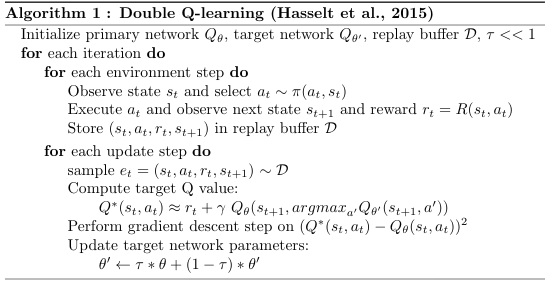

In [4]:
Image("./fig/double_dqn.png")

In [6]:
class DoubleDQNAgent(Agent):
    def __init__(self,
                 state_size,
                 action_size,
                 episodes,
                 episode_length,
                 train_interval=100,
                 Update_target_frequency=100,
                 memory_size=2000,
                 gamma=0.95,
                 learning_rate=0.001,
                 batch_size=64,
                 epsilon_min=0.01,
                 train_test='train',
                 symbol="doubledqn"
                 ):
        self.state_size = state_size
        self.action_size = action_size
        self.memory_size = memory_size
        self.memory = [None] * memory_size
        self.gamma = gamma
        self.epsilon = 1.0
        self.epsilon_min = epsilon_min
        self.epsilon_decrement = (self.epsilon - epsilon_min) \
                                 * train_interval / (episodes * episode_length)  # linear decrease rate
        self.learning_rate = learning_rate
        self.train_interval = train_interval
        self.Update_target_frequency = Update_target_frequency
        self.batch_size = batch_size
        self.brain = self._build_brain()
        self.brain_ = self._build_brain()
        self.i = 0
        self.train_test = train_test
        self.symbol=symbol


    def save_model(self):
        self.brain.save(r'./Saved Models/'+self.symbol+'.h5')

    def load_model(self):
        print(self.symbol, "path=",'./Saved Models/'+self.symbol+'.h5')
        self.brain = load_model(r'./Saved Models/'+self.symbol+'.h5')

    def _build_brain(self):
        """Build the agent's brain
        """
        # pdb.set_trace()
        brain = Sequential()
        neurons_per_layer = 24
        activation = "relu"
        brain.add(Dense(neurons_per_layer,
                        input_dim=self.state_size,
                        activation=activation))
        brain.add(Dense(neurons_per_layer * 2, activation=activation))
        brain.add(Dense(neurons_per_layer * 4, activation=activation))
        brain.add(Dense(self.action_size, activation='linear'))
        brain.compile(loss='mse', optimizer=Adam(lr=self.learning_rate))
        return brain

    def act(self, state, test=False):
        """Acting Policy of the DDDQNAgent
        """
        act_values=[]
        action = np.zeros(self.action_size)
        if np.random.rand() <= self.epsilon and self.train_test == 'train' and not test:
            action[random.randrange(
                self.action_size)] = 1  # saeed : it would put 1 in either of the 3 action positions randomly
        else:
            state = state.reshape(1, self.state_size)
            act_values = self.brain.predict(state)
            action[np.argmax(act_values[0])] = 1
        if test:
            return action, act_values
        else:
            return action

    def updateTargetModel(self):
        self.brain_.set_weights(self.brain.get_weights())

    def observe(self, state, action, reward, next_state, done, warming_up=False):
        """Memory Management and training of the agent
        """
        self.i = (self.i + 1) % self.memory_size
        self.memory[self.i] = (state, action, reward, next_state, done)
        if (self.i == self.memory_size - 1):
            # print("Memory Refilled")
            pass
        if (not warming_up) and (self.i % self.train_interval) == 0:
            if self.epsilon > self.epsilon_min:
                self.epsilon -= self.epsilon_decrement
            state, action, reward, next_state, done = self._get_batches()
            reward += (self.gamma
                       * np.logical_not(done)
                       *self.brain_.predict(next_state)[range(self.batch_size), (np.argmax(self.brain.predict(next_state), axis=1))])
            q_target = self.brain.predict(state)
            q_target[action[0], action[1]] = reward

            if self.i % self.Update_target_frequency == 0:
                self.updateTargetModel()


            return self.brain.fit(state, q_target,
                                  batch_size=self.batch_size,
                                  epochs=1,
                                  verbose=False,
                                  validation_split=0.1)

    def _get_batches(self):
        """Selecting a batch of memory
           Split it into categorical subbatches
           Process action_batch into a position vector
        """
        batch = np.array(random.sample(self.memory, self.batch_size))
        state_batch = np.concatenate(batch[:, 0]) \
            .reshape(self.batch_size, self.state_size)
        action_batch = np.concatenate(batch[:, 1]) \
            .reshape(self.batch_size, self.action_size)
        reward_batch = batch[:, 2]
        next_state_batch = np.concatenate(batch[:, 3]) \
            .reshape(self.batch_size, self.state_size)
        done_batch = batch[:, 4]
        # action processing
        action_batch = np.where(action_batch == 1)
        return state_batch, action_batch, reward_batch, next_state_batch, done_batch

# Training

regular expression

In [22]:
re.findall(r'Data1/([^_]+)', './Data1/AAPL_data.csv')[0]

'AAPL'

In [7]:
def train_agent(filename=None,
                train_test = 'train',
                episodes=10,
                train_test_split = 0.75,
                trading_fee = .0001,
                time_fee = .001,
                memory_size = 3000,
                gamma = 0.96,
                epsilon_min = 0.01,
                batch_size = 64,
                train_interval = 10,
                learning_rate = 0.001,
                render_show=False,
                display=False,
                save_results=False,
                agent_symbol="duelingdqn"
):
    start = time.time()

    generator = CSVStreamer(filename=filename, mode='train', split=train_test_split)
    episode_length = round(int(len(pd.read_csv(filename))*train_test_split), -1)

    tenv = StockTradingEnv(data_generator=generator,
                          trading_fee=trading_fee,
                          time_fee=time_fee,
                          episode_length=episode_length)
    action_size = len(tenv._actions)
    state = tenv.reset()
    state_size = len(state)

    try:
        symbol = re.findall(r'Data1/([^_]+)',filename)[0]
    except:
        symbol = ""
    
    if agent_symbol == "dqn":
        AgentCls = DQNAgent
    if agent_symbol == "duelingdqn":
        AgentCls = DuelingDQNAgent
    if agent_symbol == "doubledqn":
        AgentCls = DoubleDQNAgent
    agent = AgentCls(state_size=state_size,
                     action_size=action_size,
                     memory_size=memory_size,
                     episodes=episodes,
                     episode_length=episode_length,
                     train_interval=train_interval,
                     gamma=gamma,
                     learning_rate=learning_rate,
                     batch_size=batch_size,
                     epsilon_min=epsilon_min,
                     train_test=train_test,
                     symbol=symbol)

    # Warming up the agent
    if (train_test == 'train'):
        for _ in range(memory_size):
            action = agent.act(state)
            next_state, reward, done, _ = tenv.step(action)
            agent.observe(state, action, reward, next_state, done, warming_up=True)
        if display:
            print('completed mem allocation: ', time.time() - start)

    # Training the agent
    loss_list=[]
    val_loss_list=[]
    reward_list=[]
    epsilon_list=[]
    metrics_df=None
    if train_test == "train":
        best_loss = 9999
        best_reward = 0
        for ep in range(episodes):
            ms = time.time()
            state = tenv.reset()
            rew = 0
            loss_list_temp = []
            val_loss_list_temp = []

            for _ in range(episode_length):
                action = agent.act(state)
                next_state, reward, done, _ = tenv.step(action)
                loss = agent.observe(state, action, reward, next_state,
                                     done)  # loss would be none if the episode length is not % by 10
                state = next_state
                rew += reward
                if(loss):
                    loss_list_temp.append(round(loss.history["loss"][0],3))
                    val_loss_list_temp.append(round(loss.history["val_loss"][0],3))

            if display:
                print("Ep:" + str(ep)
                      + "| rew:" + str(round(rew, 2))
                      + "| eps:" + str(round(agent.epsilon, 2))
                      + "| loss:" + str(round(loss.history["loss"][0], 4))
                      + "| runtime:" + str(time.time() - ms))
                print("Loss=", str(np.mean(loss_list_temp)), " Val_Loss=", str(np.mean(val_loss_list_temp)))

            loss_list.append(np.mean(loss_list_temp))
            val_loss_list.append(np.mean(val_loss_list_temp))
            reward_list.append(rew)
            epsilon_list.append(round(agent.epsilon, 2))

        agent.save_model()

        metrics_df=pd.DataFrame({'loss':loss_list,'val_loss':val_loss_list,'reward':reward_list,'epsilon':epsilon_list})

        if save_results:
            metrics_df.to_csv(r'./Results/training_perf_{}_{}.csv'.format(
                                symbol, agent_symbol))

    if(train_test=='test'):
        agent.load_model()

    generator = CSVStreamer(filename=filename, mode='test', split=train_test_split)
    tenv = StockTradingEnv(data_generator=generator,
                          trading_fee=trading_fee,
                          time_fee=time_fee,
                          episode_length=episode_length)

    done = False
    state = tenv.reset()
    q_values_list=[]
    state_list=[]
    action_list=[]
    reward_list=[]
    trade_list=[]

    while not done:
        action, q_values = agent.act(state, test=True)
        state, reward, done, info = tenv.step(action)
        if 'status' in info and info['status'] == 'Closed plot':
            done = True
        else:
            reward_list.append(reward)

            calc_returns=tenv.return_calc(render_show)
            if calc_returns:
                trade_list.append(calc_returns)

            if render_show:
                tenv.render()


        q_values_list.append(q_values)
        state_list.append(state)
        action_list.append(action)

    print('Reward = %.2f' % sum(reward_list))

    trades_df=pd.DataFrame(trade_list)
    action_policy_df = pd.DataFrame({'q_values':q_values_list,'state':state_list,'action':action_list})

    if save_results:
        trades_df.to_csv(r'./Results/testing_trade_{}_{}.csv'.format(
                            symbol, agent_symbol))
        #action_policy_df.to_pickle(r'./Results/action_policy.pkl')

    if display:
        print("All done:", str(time.time() - start))

    return({"metrics_df":metrics_df,
            "trades_df":trades_df,
            "action_policy_df":action_policy_df,
            "reward_list":reward_list})


In [8]:
from utils import sharpe_calc

/home/wzhuai/.conda/envs/dl/lib/python3.6/site-packages/stockstats.py:474: FutureWarning:

Currently, 'apply' passes the values as ndarrays to the applied function. In the future, this will change to passing it as Series objects. You need to specify 'raw=True' to keep the current behaviour, and you can pass 'raw=False' to silence this warning

/home/wzhuai/.conda/envs/dl/lib/python3.6/site-packages/pandas/core/indexing.py:205: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/home/wzhuai/.conda/envs/dl/lib/python3.6/site-packages/ipykernel_launcher.py:38: FutureWarning:

Method .as_matrix will be removed in a future version. Use .values instead.

/home/wzhuai/.conda/envs/dl/lib/python3.6/site-packages/matplotlib/axis.py:1035: UserWarning:

Unable to find pixel distance along axis for interval padding of ti

Reward = 0.46
Time Taken =  464.60903429985046


/home/wzhuai/MM/RL in Quantitative Finance/utils.py:81: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/home/wzhuai/.conda/envs/dl/lib/python3.6/site-packages/pandas/core/indexing.py:494: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



Reward = 2.05
Time Taken =  534.6394352912903
Reward = 49.59
Time Taken =  563.8591494560242
Reward = 356.63
Time Taken =  479.66307616233826
Reward = 369.10
Time Taken =  552.0873565673828
Reward = 462.74
Time Taken =  579.008674621582
Reward = -0.32
Time Taken =  496.1711149215698
Reward = 189.85
Time Taken =  571.3593208789825
Reward = -0.32
Time Taken =  597.0356347560883
Reward = 8.12
Time Taken =  511.0193827152252
Reward = 8.55
Time Taken =  590.5340526103973
Reward = -0.35
Time Taken =  615.31400847435
Reward = 6.59
Time Taken =  526.2252860069275
Reward = 4.67
Time Taken =  609.0429878234863
Reward = 11.66
Time Taken =  634.8252046108246


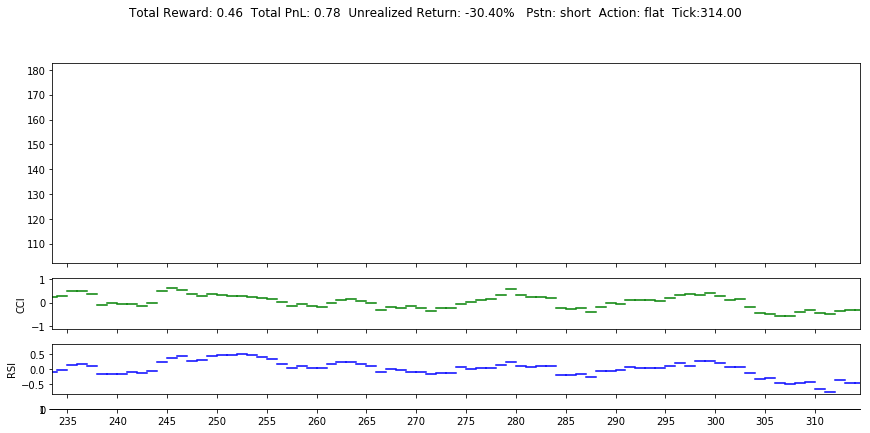

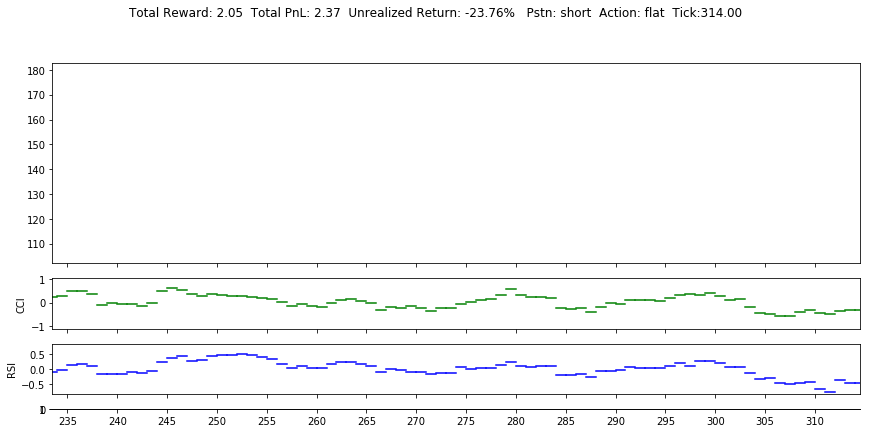

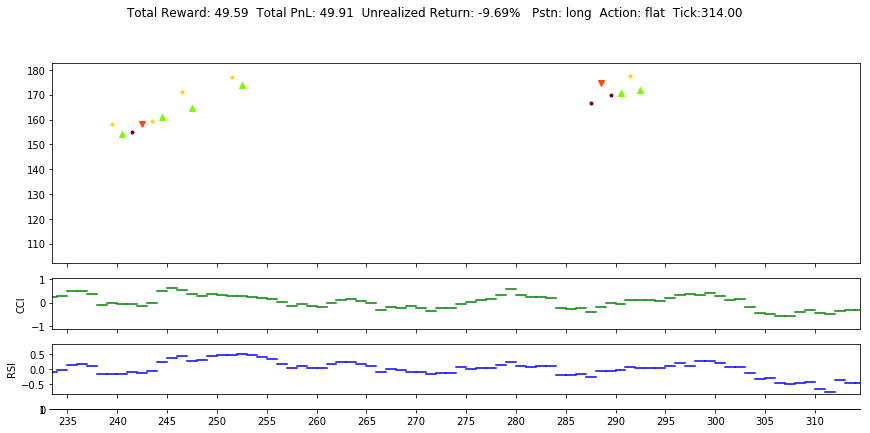

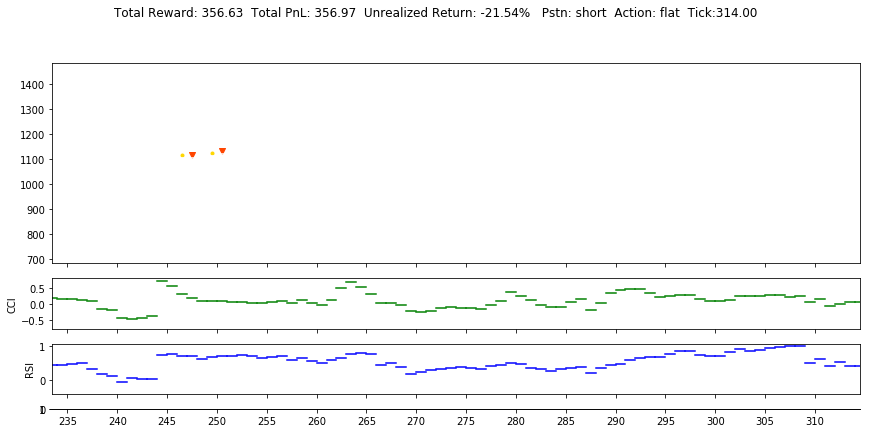

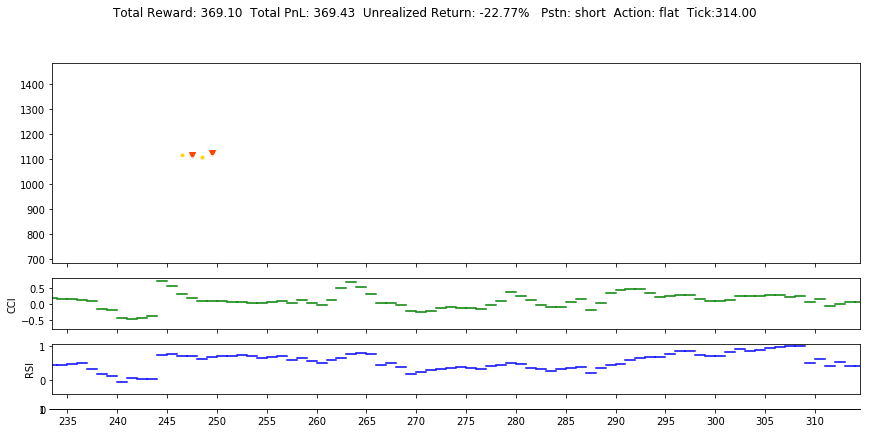

...

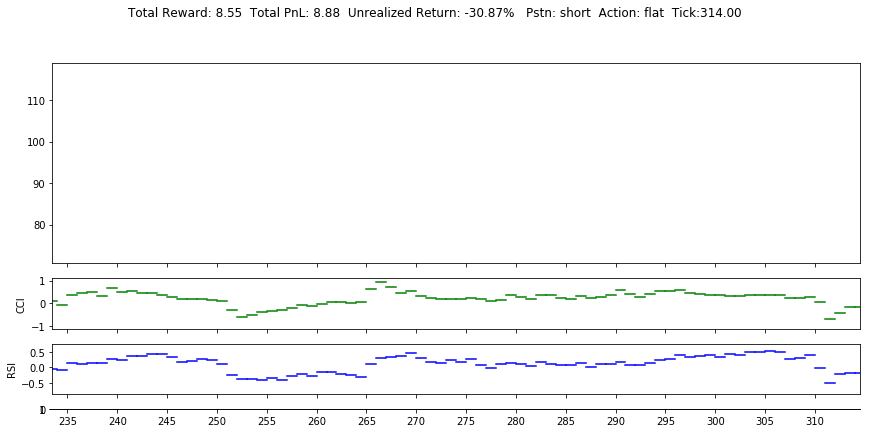

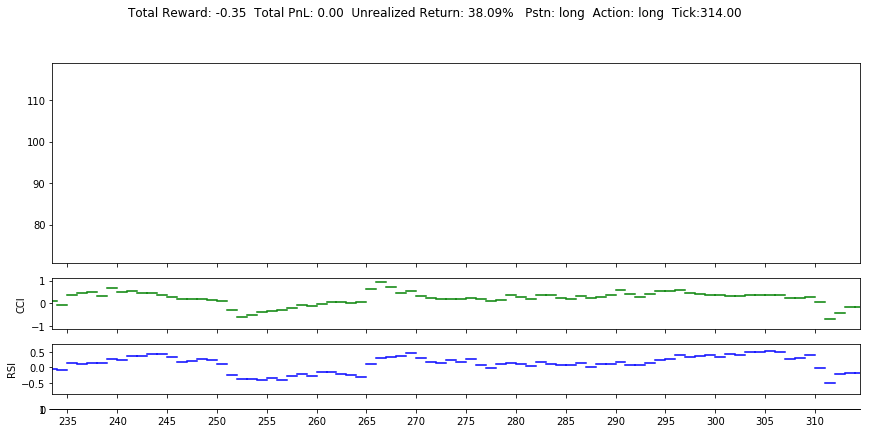

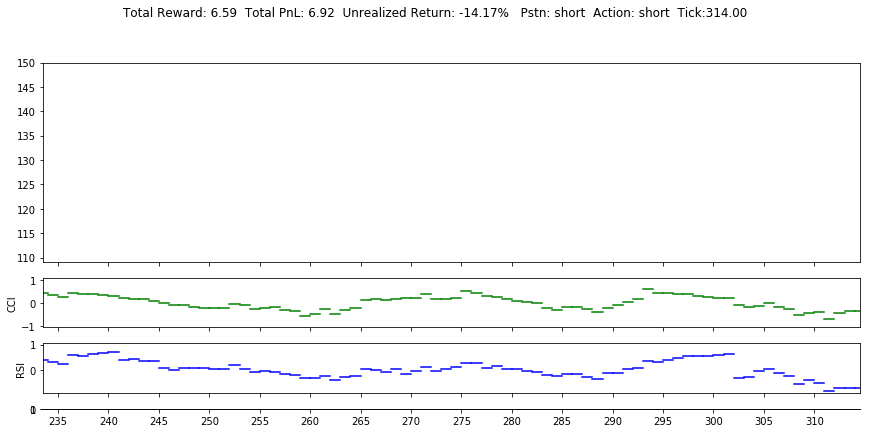

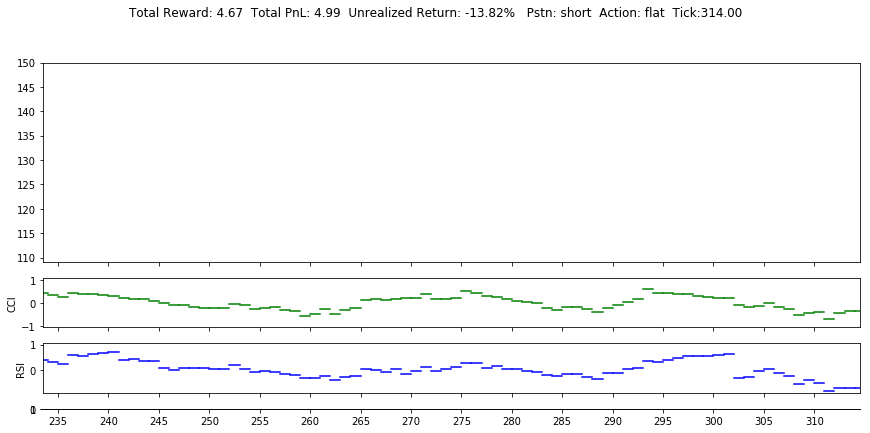

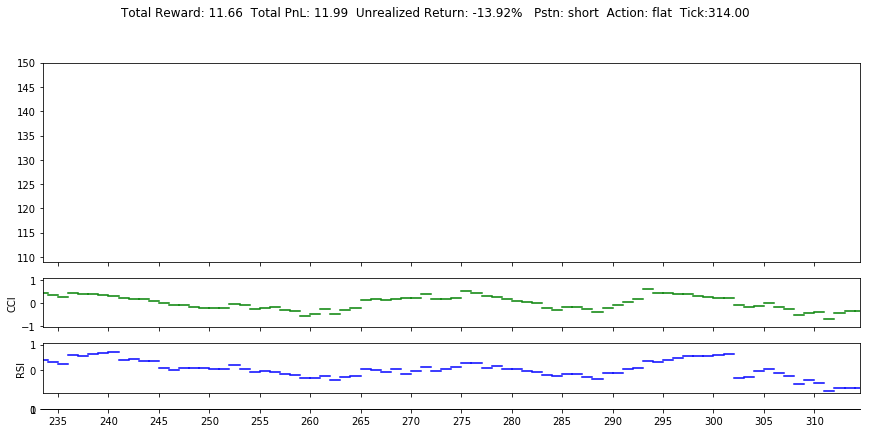

In [12]:
train_test_split=0.75
results_dict={}
stock_list = ["AMZN"]

for stock in stock_list:
    results_dict[stock] = {}
    for agt_sym in ["dqn", "doubledqn", "duelingdqn"]:
        start = time.time()
        results=train_agent(filename="./Data1/{}_data.csv".format(stock),
                            train_test_split=train_test_split,
                            episodes=200,
                            display=False,
                            render_show=True,
                            save_results=True,
                            agent_symbol=agt_sym)
        end = time.time()
        print('Time Taken = ',end-start)
        df=pd.read_csv("./Data1/{}_data.csv".format(stock))
        df=df.iloc[int(train_test_split*len(df)):,:]
        returns=df.close.pct_change()
        perf_metrics = sharpe_calc(results['trades_df'].copy())

        results['buy_and_hold_sharpe']=np.mean(returns)/np.std(returns)
        results['strategy_sharpe']=perf_metrics['strategy_sharpe']
        results['num_trades']=perf_metrics['num_trades']
        results['position_df']=perf_metrics['position_df']
        
        results_dict[stock][agt_sym] =results
        gc.collect()

pickle.dump(results_dict, open("results_revised.p","wb"))

# Analytics

In [2]:
with open("results_revised.p","rb") as inF:
    results_dict = pickle.load(inF)


In [12]:
print( results_dict["AAPL"]["dqn"]["strategy_sharpe"] )
print( results_dict["AAPL"]["doubledqn"]["strategy_sharpe"] )
print( results_dict["AAPL"]["duelingdqn"]["strategy_sharpe"] )
print( results_dict["AAPL"]["dqn"]["buy_and_hold_sharpe"] )

3.832754317604523
-0.18193281511918888
0.4823718921604163
0.10494215674904778


In [13]:
print( results_dict["AMZN"]["dqn"]["strategy_sharpe"] )
print( results_dict["AMZN"]["doubledqn"]["strategy_sharpe"] )
print( results_dict["AMZN"]["duelingdqn"]["strategy_sharpe"] )
print( results_dict["AMZN"]["dqn"]["buy_and_hold_sharpe"] )

1.2007136264576843
1.0407223003858446
0.6829290784862998
0.14265110018752025


In [15]:
print( results_dict["JPM"]["dqn"]["strategy_sharpe"] )
print( results_dict["JPM"]["doubledqn"]["strategy_sharpe"] )
print( results_dict["JPM"]["duelingdqn"]["strategy_sharpe"] )
print( results_dict["JPM"]["dqn"]["buy_and_hold_sharpe"] )

0.06921501706484633
3.2739979884533823
None
0.14279484861107755


In [1]:
import pandas as pd
import numpy as np
import os
import glob
import warnings
import time
import pickle
import plotly.offline as py
from plotly.tools import FigureFactory as FF
from plotly.graph_objs import *

py.init_notebook_mode()
warnings.filterwarnings('ignore')

from Main import World
from Analytics.Trade_Analytics import sharpe_calc
from Analytics.Training_Analytics import loss_vis, reward_vis
import gc
import re

Using TensorFlow backend.


In [3]:
results_dict = pickle.load(open(r"./results_revised.p", "rb"))

In [4]:
results_df=pd.DataFrame({'Symbols':list(results_dict.keys()),
'Buy and Hold Sharpe':[x['buy_and_hold_sharpe'] for x in list(results_dict.values())],
'Strategy Sharpe':[x['strategy_sharpe'] for x in list(results_dict.values())],
'Number of Trades':[x['num_trades'] for x in list(results_dict.values())],
'Buy and Hold Total Return':[x['buy_n_hold_tot_return'] for x in list(results_dict.values())],
'Strategy Total Return':[x['strategy_tot_return'] for x in list(results_dict.values())],
})
results_df_filt=results_df.dropna()
results_df_filt.head()

,Symbols,Buy and Hold Sharpe,Strategy Sharpe,Number of Trades,Buy and Hold Total Return,Strategy Total Return
0,COTY,-0.001793,0.522897,24.0,-0.010763,0.425965
1,CMS,0.008286,1.647612,21.0,0.021951,0.332393
2,CNC,0.082073,0.643396,4.0,0.542984,0.296637
3,CSRA,-0.022823,0.502373,7.0,-0.042829,0.056752
4,CSCO,0.084183,0.830318,13.0,0.283655,0.222759


In [5]:
results_df_filt[results_df_filt['Number of Trades']>2].mean()

Buy and Hold Sharpe           0.045538
Strategy Sharpe               1.259177
Number of Trades             11.474719
Buy and Hold Total Return     0.177348
Strategy Total Return         0.211320
dtype: float64

In [6]:
test=results_df_filt[results_df_filt['Number of Trades']>2]
x0 = np.random.randn(500)
x1 = np.random.randn(500)+1

trace1 = Histogram(
    x=test["Strategy Sharpe"],
    opacity=0.75,
    name='Buy_n_Hold'
)
trace2 = Histogram(
    x=test['Buy and Hold Sharpe'],
    opacity=0.75,
    name='DDDQN'
)

data = [trace1, trace2]
layout = Layout(title='Risk Adjusted return Histogram',barmode='overlay')
fig = Figure(data=data, layout=layout)

py.iplot(fig, filename='overlaid histogram')

In [2]:
stocks_csv=glob.glob(r"./Data/*.csv")
stocks_csv.sort()
len(stocks_csv)
symbol_path=dict(zip([re.findall(r'Data\\([^_]+)',x)[0] for x in stocks_csv],stocks_csv))
# stocks_csv

In [4]:
%matplotlib tk
symbol='AMZN'
x=World(filename=symbol_path[symbol],train_test_split=.75,train_test='test',render_show=True)

AMZN path= ./Saved Models/AMZN.h5
Reward = 288.83
